In [17]:
import sys
from pathlib import Path
# Add the parent directory to the path to import modules
sys.path.append(str(Path.cwd().parents[2]))

In [18]:
from os import path
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import nltk
from nltk.tokenize import RegexpTokenizer
nltk.download('punkt')
from db.database import Database

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Adrian\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [19]:
db = Database()
blueprints = db.get_all_blueprints()

Loading blueprints: 100%|██████████| 2196/2196 [00:01<00:00, 1480.80it/s]


In [20]:
data = []
for bp in blueprints:
    bp_dict = {
        "blueprint_url": bp.blueprint_url,
        "blueprint_code": bp.blueprint_code,
        "topic_title": bp.post.topic.title,
        "topic_tags": bp.post.topic.tags,
    }
    data.append(bp_dict)
df_bp = pd.DataFrame(data)
df_bp['topic_tags'] = df_bp['topic_tags'].apply(eval)

In [21]:
# concat tags lists from all rows and create unique tags list
tags = df_bp["topic_tags"].sum()
tags = list(set(tags))
# create a new column for each tag and fill it with 0 or 1
for tag in tags:
    df_bp[f'tag_{tag}'] = df_bp["topic_tags"].apply(lambda x: 1 if tag in x else 0)


<Axes: title={'center': 'Count of each tag'}, xlabel='Tag', ylabel='Count'>

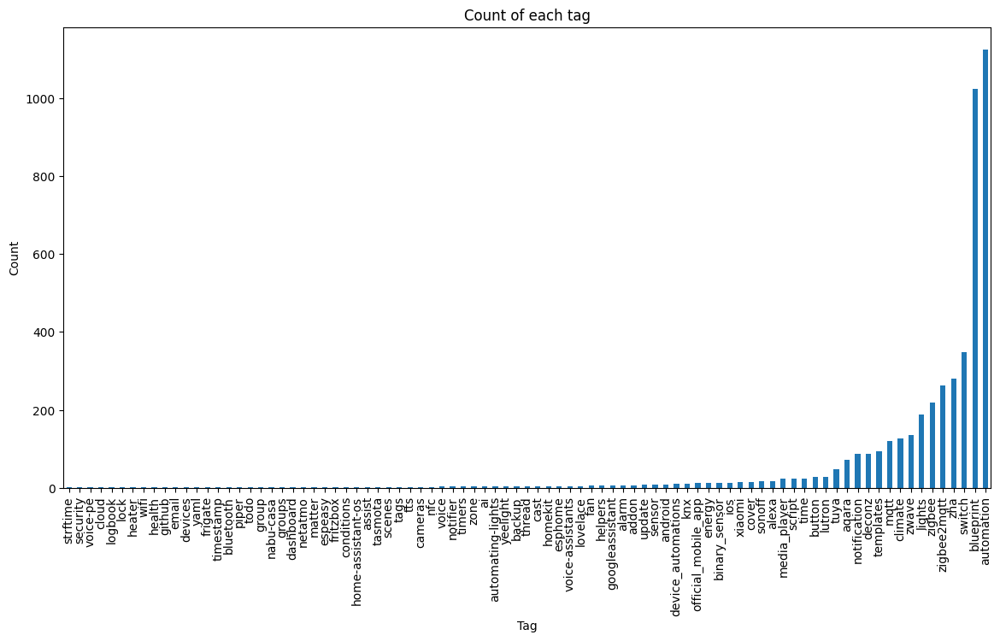

In [22]:
# plot the count of each tag
plt.figure(figsize=(14, 7))
plt.title("Count of each tag")
plt.xlabel("Tag")
plt.ylabel("Count")
tags_columns = [col for col in df_bp.columns if col.startswith('tag_')]
df_tags = df_bp[tags_columns]
new_columns = [col.replace('tag_', '') for col in df_tags.columns]
df_tags = df_tags.rename(columns=dict(zip(df_tags.columns, new_columns)))
df_tags.sum().sort_values().plot(kind="bar")

In [23]:
def custom_tokenizer(text):
    tokenizer_regex = r"(?u)\b\w+\b"
    
    # Create a tokenizer using the regular expression
    tokenizer = RegexpTokenizer(tokenizer_regex)
    
    # Tokenize the text
    tokens = tokenizer.tokenize(text)
    
    # Filter out tokens that are numbers or 'true'/'false'
    # Additionally, ensure tokens are not single-character (mimicking the default behavior)
    filtered_tokens = [token for token in tokens if not token.isdigit() and token.lower() not in ['true', 'false'] and len(token) > 1]
    return filtered_tokens

In [24]:
tfidf_vectorizer = TfidfVectorizer(min_df=64, max_df=0.6, tokenizer=custom_tokenizer)
tfidf_matrix = tfidf_vectorizer.fit_transform(df_bp['blueprint_code'])

c:\Users\Adrian\anaconda3\Lib\site-packages\sklearn\feature_extraction\text.py:525: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


In [25]:
feature_names = tfidf_vectorizer.get_feature_names_out()
tfidf_df = pd.DataFrame(tfidf_matrix.todense(), columns=feature_names)
# vocabularies size
print(f"Vocabularies size: {len(tfidf_vectorizer.vocabulary_)}")

Vocabularies size: 601


Explained variance ratio: [0.03451092 0.01989928 0.01776666 0.01590729 0.01472299 0.01315747
 0.01172049 0.01153839 0.01072586 0.00994424 0.00946481 0.00873314
 0.00853154 0.00795693 0.00771569 0.00760176 0.00696589 0.00683788
 0.00653157 0.0064468  0.00640491 0.00626999 0.00612012 0.00596699
 0.00577408 0.00572771 0.00557819 0.0055366  0.00538828 0.0053822
 0.0053258  0.00525572 0.00515777 0.00510169 0.00509081 0.00501444
 0.00490428 0.00480493 0.00476761 0.00473498 0.0046961  0.00460476
 0.00456906 0.00455216 0.00449449 0.00447935 0.00441206 0.00432845
 0.00426302 0.00421709 0.00419631 0.00414638 0.00411958 0.00408563
 0.00402586 0.00401133 0.00397406 0.00392685 0.00392097 0.00385859
 0.00383042 0.00377612 0.00373276 0.00372165 0.00367992 0.00364926
 0.00358574 0.00356441 0.00354726 0.00349241 0.00346042 0.00345676
 0.00341902 0.00341245 0.00338291 0.00334849 0.0033359  0.00329375
 0.0032539  0.00323186 0.00321596 0.00318158 0.00315635 0.003152
 0.00312518 0.00310439 0.00308053 0.003

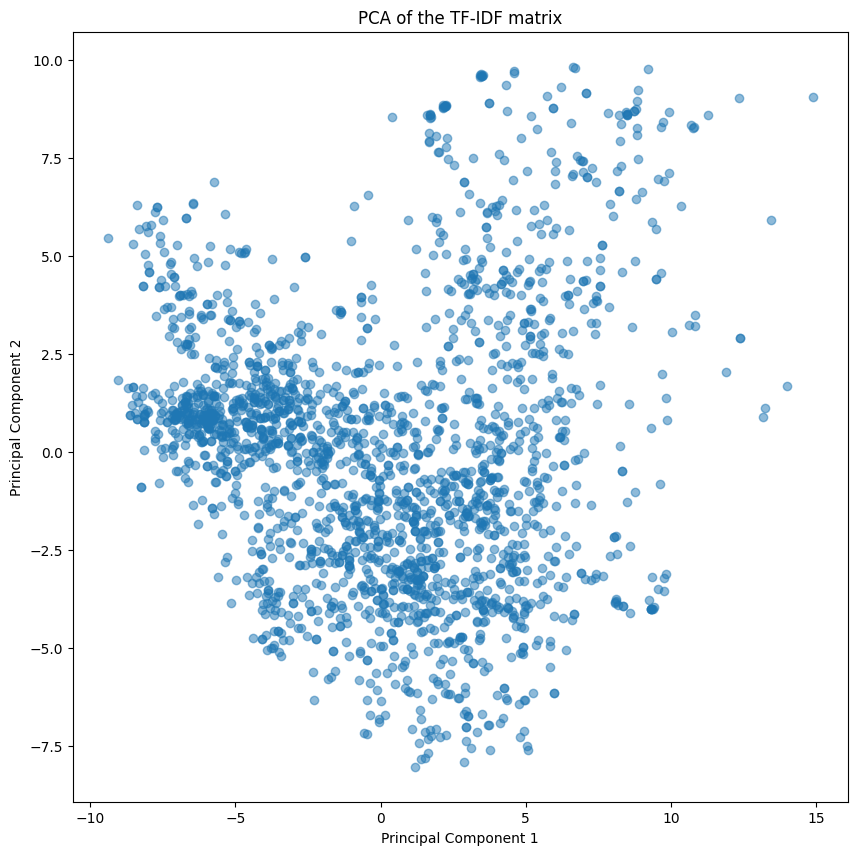

In [26]:
# PCA to reduce the dimensionality of the tfidf matrix
dim = 128
tfidf_scaled = StandardScaler().fit_transform(tfidf_matrix.toarray())
pca = PCA(n_components=dim)
pca_arr = pca.fit_transform(tfidf_scaled)

# calculate the explained variance ratio
explained_variance = pca.explained_variance_ratio_
print(f"Explained variance ratio: {explained_variance}")
# total explained variance
print(f"Total explained variance: {explained_variance.sum()}")

# Visualize the PCA results
plt.figure(figsize=(10, 10))
plt.scatter(pca_arr[:, 0], pca_arr[:, 1], alpha=0.5)
plt.title("PCA of the TF-IDF matrix")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.show()


In [27]:
# add pca_arr to df_bp
for i in range(dim):
    df_bp[f"pca_{i}"] = pca_arr[:, i]

C:\Users\Adrian\AppData\Local\Temp\ipykernel_2656\1891837432.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_bp[f"pca_{i}"] = pca_arr[:, i]
C:\Users\Adrian\AppData\Local\Temp\ipykernel_2656\1891837432.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_bp[f"pca_{i}"] = pca_arr[:, i]
C:\Users\Adrian\AppData\Local\Temp\ipykernel_2656\1891837432.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all colum

In [28]:
tags_columns = [col for col in df_bp.columns if col.startswith('tag_')]
tags = [col.replace('tag_', '') for col in tags_columns]
tags_counts = df_bp[tags_columns].sum()
tags_counts.values

array([  48,  218,    1,    1,   29,    4,    1, 1024,    5,    2,  121,
          1,    2,    1,    6,    2,    9,   12,    6,    1,    1,    1,
          2,    8,    1,    2,    1,   24,    1,    2,   87,  263,  188,
          4,    1,   12,    5,    1,   87,   13,  135,    1,  127,    2,
          2,    5,    6,   73,    2,    5, 1125,   12,    3,   94,   14,
         14,    1,    1,   10,    2,    2,    1,   17,    1,    3,   23,
          1,    2,   29,    1,    4,    2,    9,    6,    5,    3,  280,
         10,    6,    3,    1,  348,   18,   24,    4,    4,    2],
      dtype=int64)

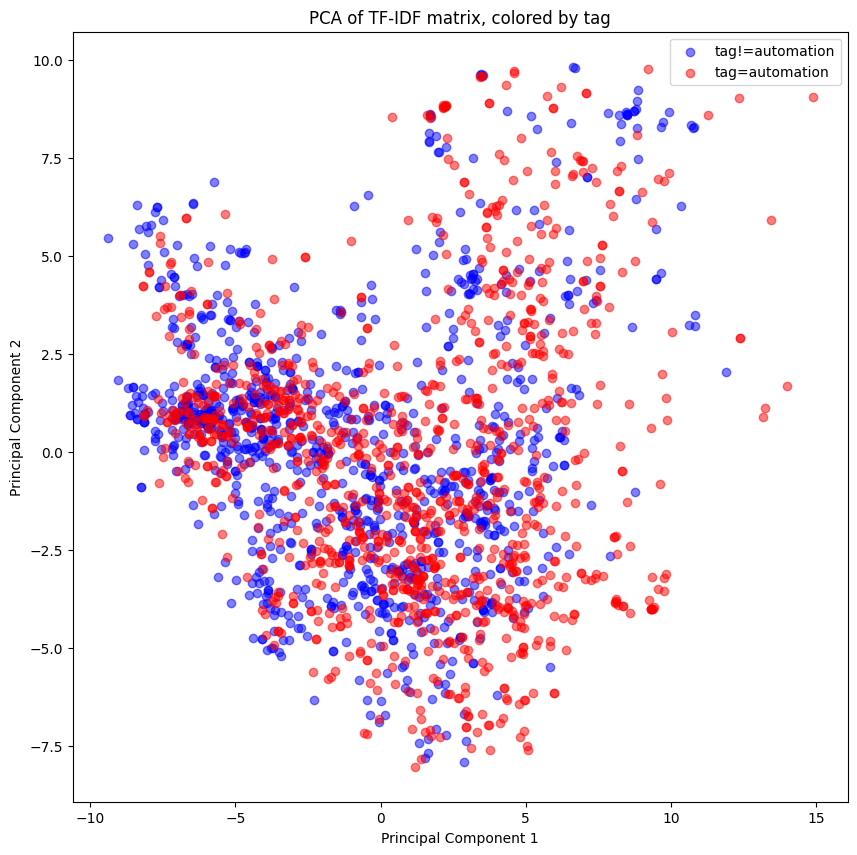

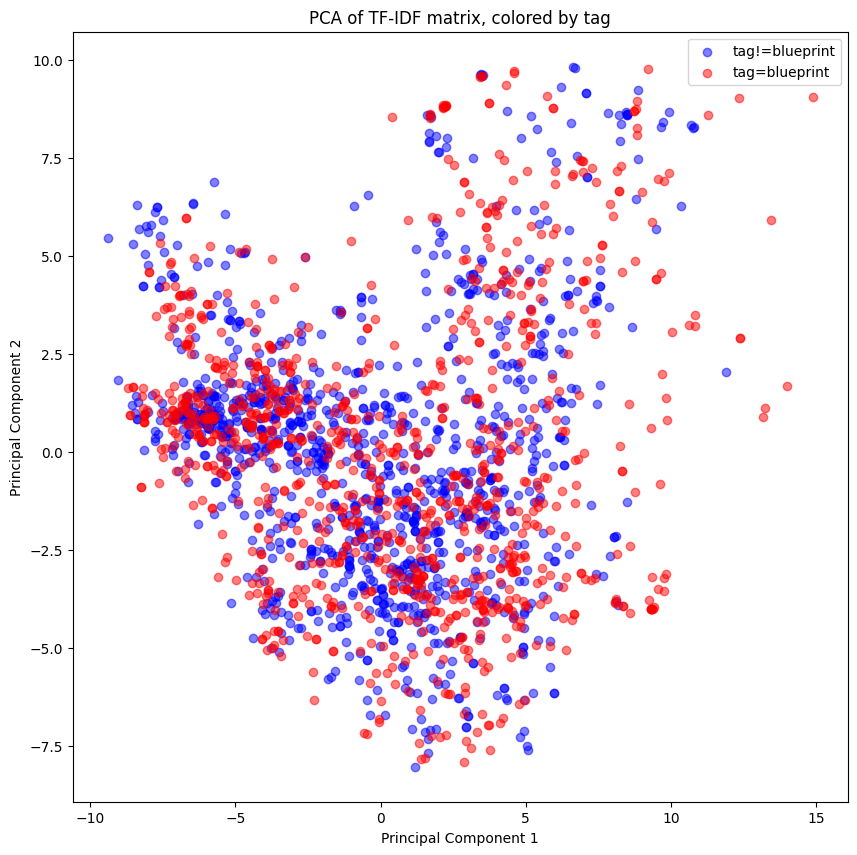

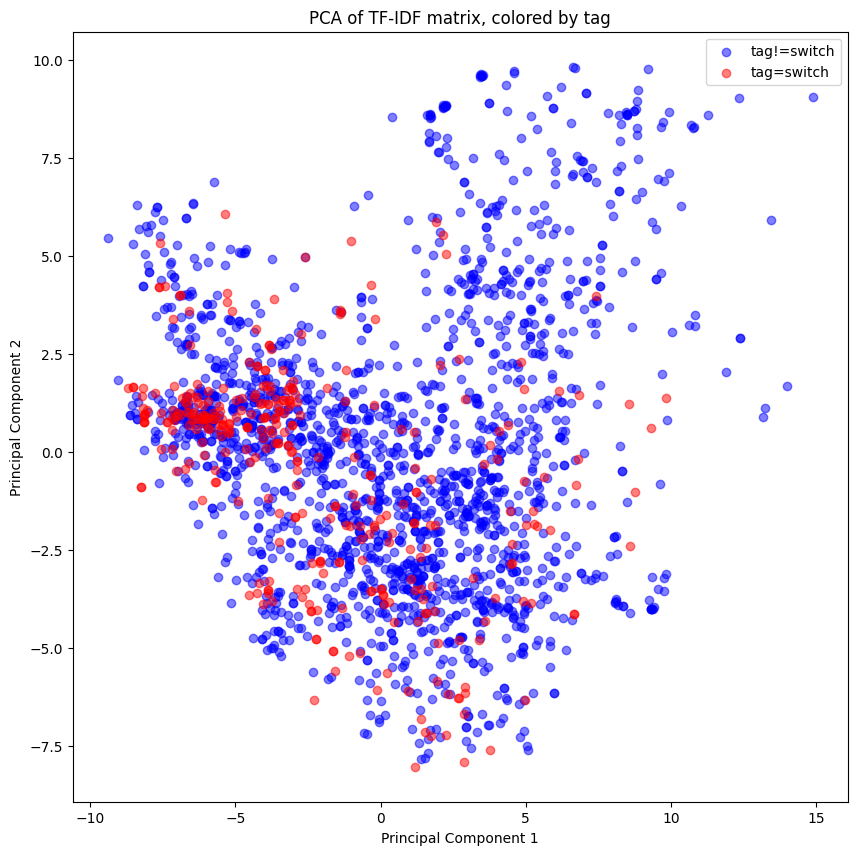

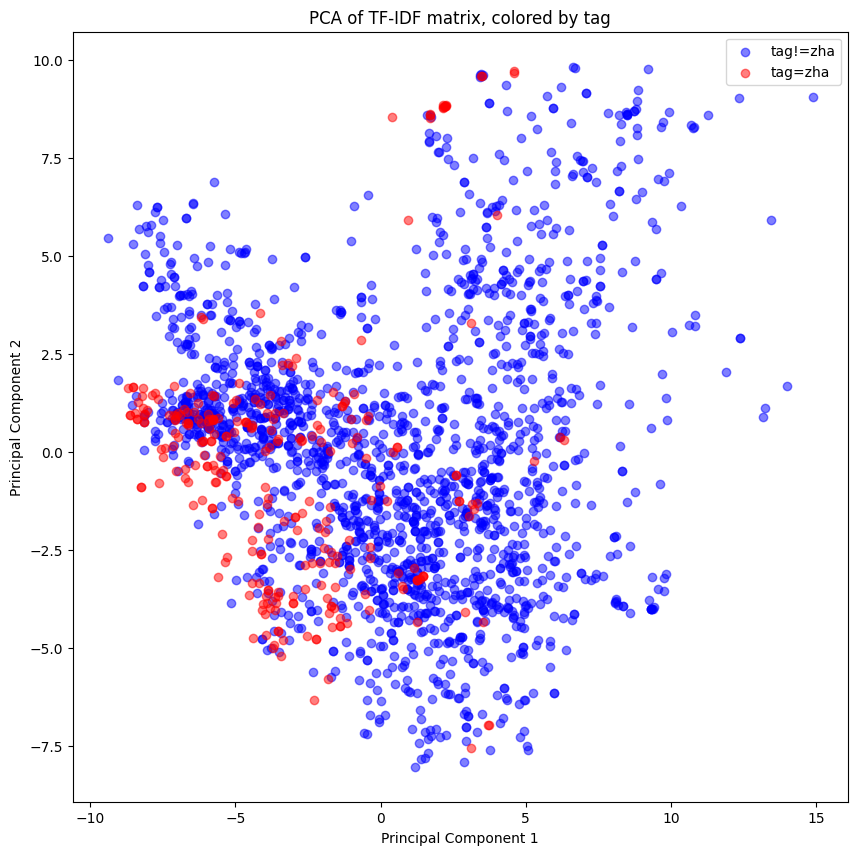

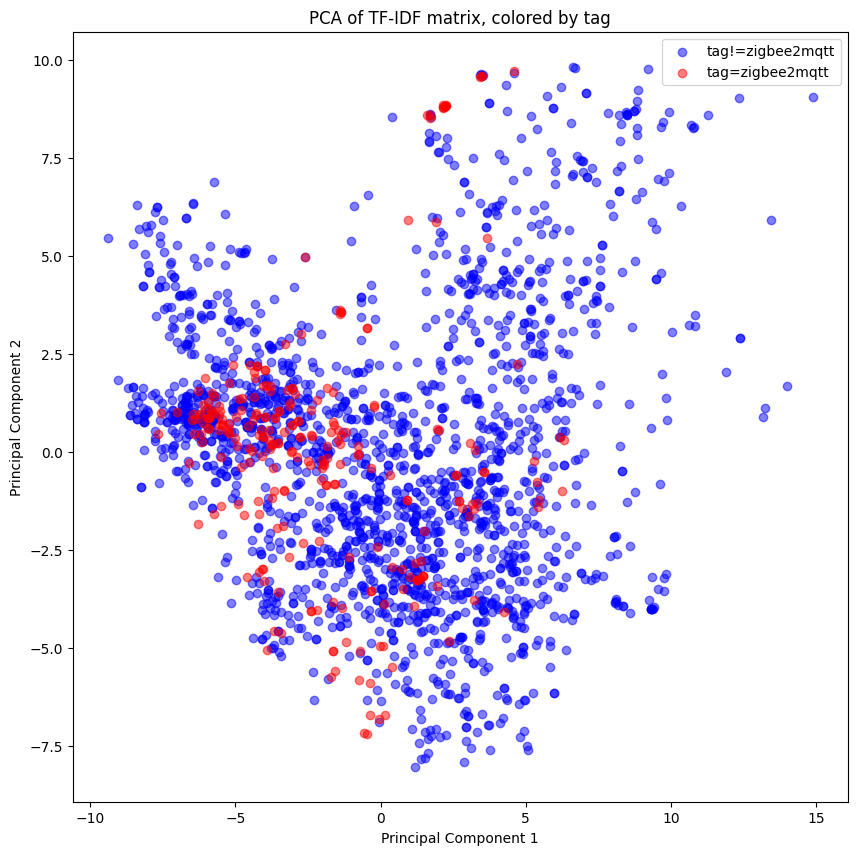

...

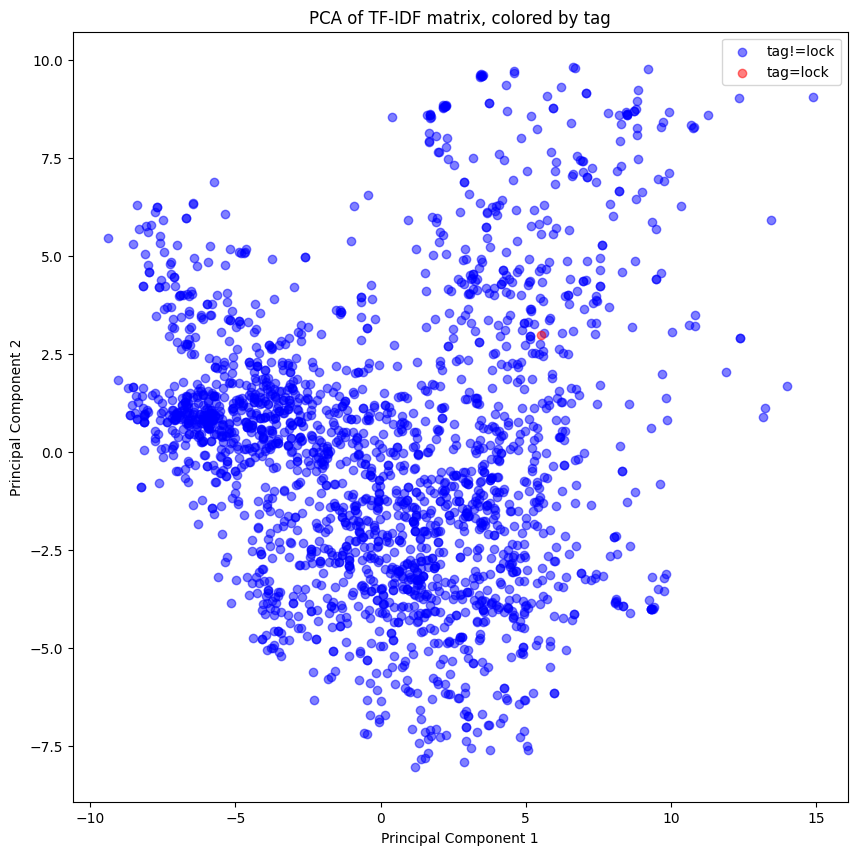

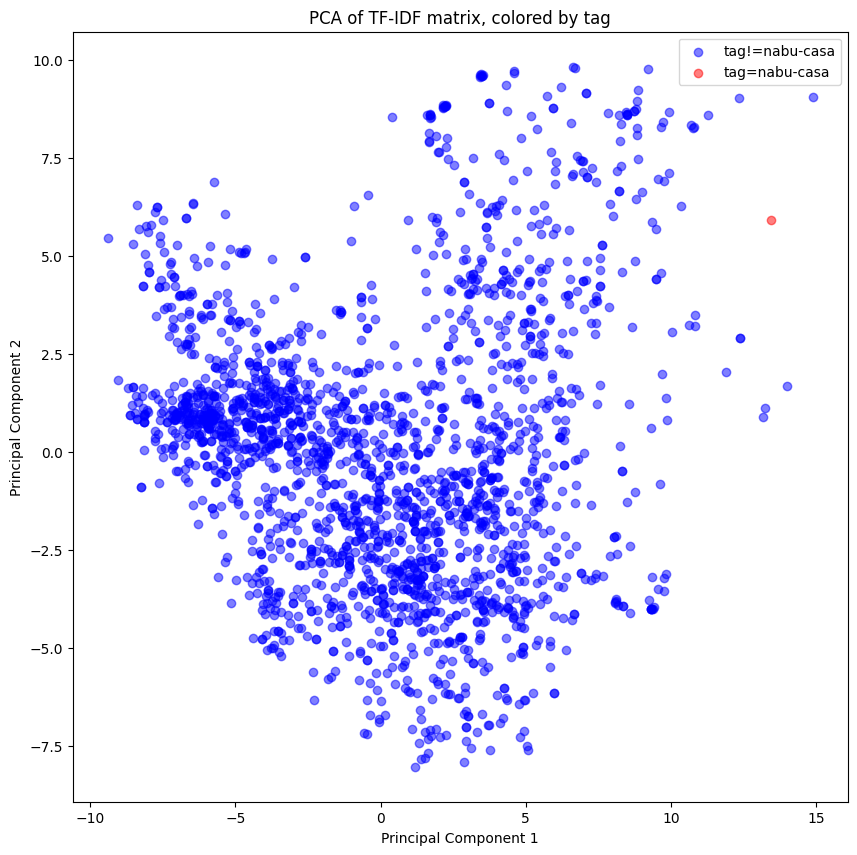

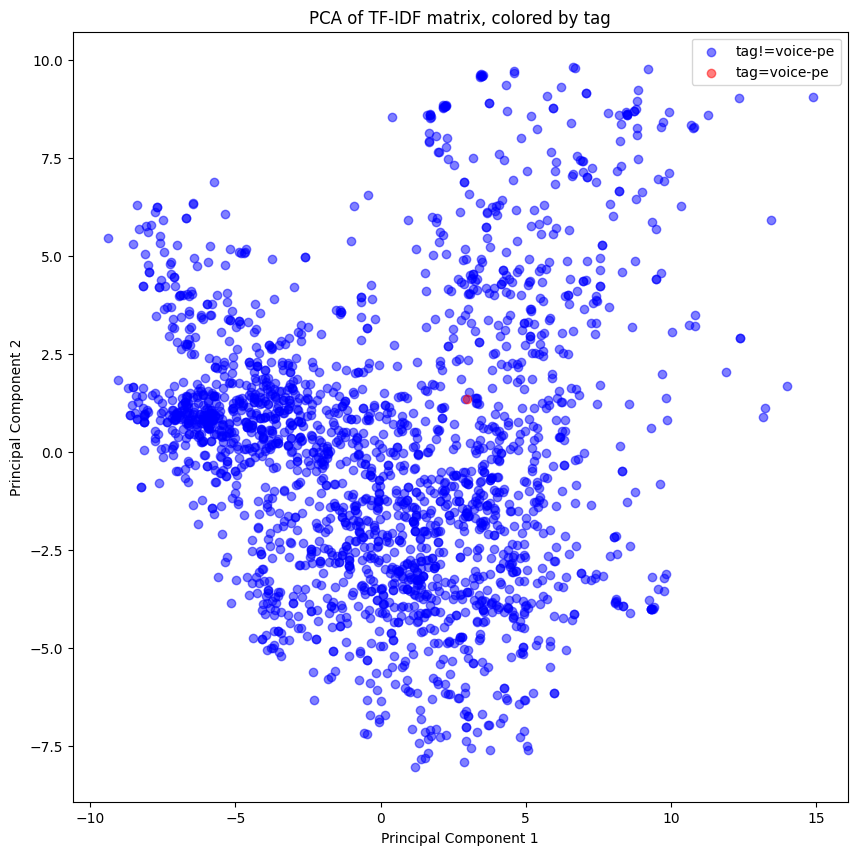

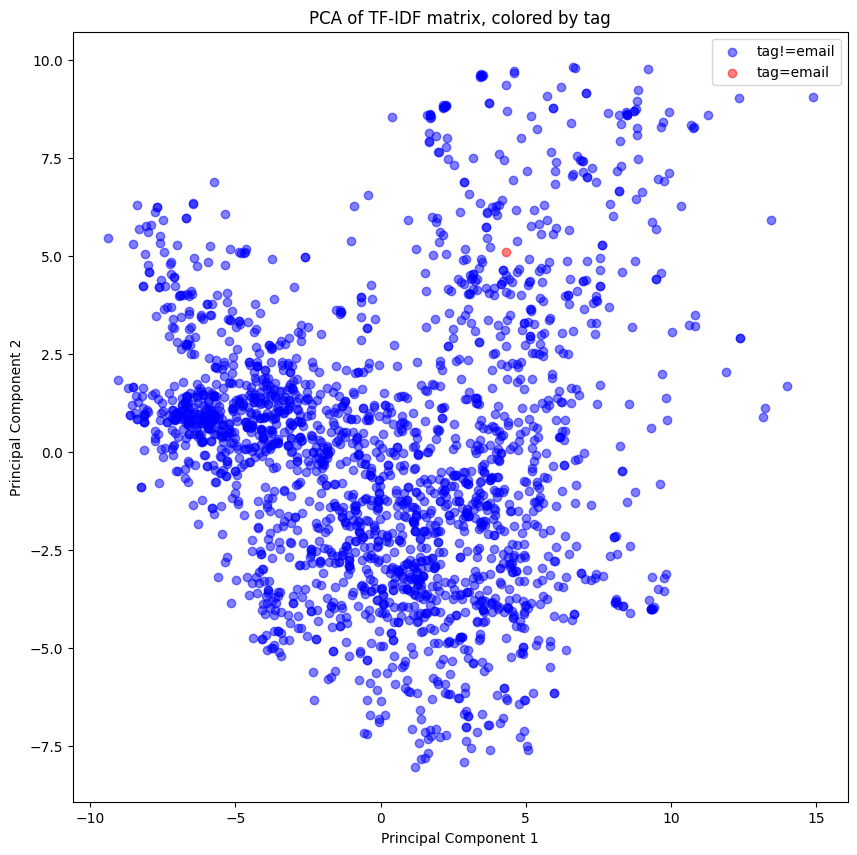

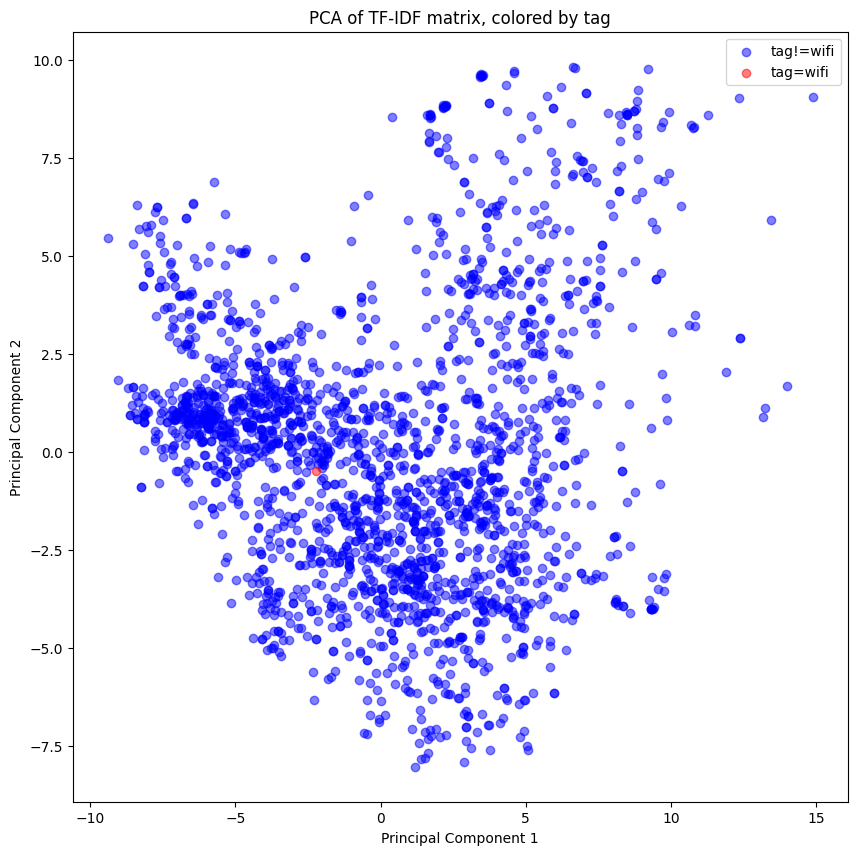

In [29]:
tag_list = df_tags.sum().sort_values(ascending=False).index
for tag in tag_list:
    plt.figure(figsize=(10, 10))
    plt.scatter(df_bp[df_bp[f'tag_{tag}'] == 0]["pca_0"], df_bp[df_bp[f'tag_{tag}'] == 0]["pca_1"], alpha=0.5, color='blue', label=f"tag!={tag}")
    plt.scatter(df_bp[df_bp[f'tag_{tag}'] == 1]["pca_0"], df_bp[df_bp[f'tag_{tag}'] == 1]["pca_1"], alpha=0.5, color='red', label=f"tag={tag}")
    plt.title("PCA of TF-IDF matrix, colored by tag")
    plt.xlabel("Principal Component 1")
    plt.ylabel("Principal Component 2")
    plt.legend()
    plt.show()

